# **Evaluation Notebook**





#**Preparations**


> In this group of cells we will prepare all the variables, code & configurations that we might need while going through all the phases of increamental learning.

** Do not run any code from any phase without running this group of cells **




## Mount Drive


>First we need to mount the drive so we can retrieve the code and data from our storage in to the notebook.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Install Necessary Packages


> We need to install the packages that are needed for this model. Most of the packages are already installed in google colab. We will install the packages which are either not installed or we need some specific version of the package.




In [ ]:
# keras version 2.0.8,
# tensorflow version 1.5 ,
# version mrcnn 0.1 works!
%tensorflow_version 1.x
for _ in range(2):
  !pip install keras==2.0.8
!pip install mrcnn==0.1


TensorFlow is already loaded. Please restart the runtime to change versions.


##Import all the necessary Code & set Required Parameters

>We now import all the necessary code and classes that we would need for this model to work. We will also set all the paths that might be needed for loading data from the storage.




In [ ]:
import os
import imgaug.augmenters as iaa
import csv
import copy
import matplotlib
import matplotlib.pyplot as plt
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib
from mrcnn.config import Config
import mrcnn.visualize
from mrcnn.model import log
import sys
import random
import math
import re
import time
import numpy as np
import cv2
from os.path import join
import sys
import skimage
from skimage.filters import threshold_mean
from skimage.color import rgb2gray, gray2rgb
import json
from PIL import Image, ImageDraw
from pathlib import Path
import collections
from collections import defaultdict
from pycocotools import mask as MASK
from skimage import measure
from sklearn.metrics import classification_report
from IPython.display import clear_output
from mrcnn.visualize import display_images
import tensorflow as tf
from sklearn.utils import shuffle
%matplotlib inline
# Root directory of the project
ROOT_DIR='/content/drive/MyDrive/MASK-RCNN (22-4-21)'
MODEL_DIR_WEIGHTS=os.path.join(ROOT_DIR,"Weights")
RESULTANTDATASETFOLDER=ROOT_DIR+"/dataset"
R_Images=RESULTANTDATASETFOLDER+"/images/"
R_Masks=RESULTANTDATASETFOLDER+"/masks/"
MODEL_LOG_DIR="./"


def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.

    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax
def pltGraph(epochs,history):
  plt.figure(figsize=(21,11))
  plt.subplot(231)
  plt.plot(epochs, history["loss"], label="Train loss")
  plt.plot(epochs, history["val_loss"], label="Valid loss")
  plt.legend()
  plt.subplot(232)
  plt.plot(epochs, history["rpn_class_loss"], label="Train RPN class ce")
  plt.plot(epochs, history["val_rpn_class_loss"], label="Valid RPN class ce")
  plt.legend()
  plt.subplot(233)
  plt.plot(epochs, history["rpn_bbox_loss"], label="Train RPN box loss")
  plt.plot(epochs, history["val_rpn_bbox_loss"], label="Valid RPN box loss")
  plt.legend()
  plt.subplot(234)
  plt.plot(epochs, history["mrcnn_class_loss"], label="Train MRCNN class ce")
  plt.plot(epochs, history["val_mrcnn_class_loss"], label="Valid MRCNN class ce")
  plt.legend()
  plt.subplot(235)
  plt.plot(epochs, history["mrcnn_bbox_loss"], label="Train MRCNN box loss")
  plt.plot(epochs, history["val_mrcnn_bbox_loss"], label="Valid MRCNN box loss")
  plt.legend()
  plt.subplot(236)
  plt.plot(epochs, history["mrcnn_mask_loss"], label="Train Mask loss")
  plt.plot(epochs, history["val_mrcnn_mask_loss"], label="Valid Mask loss")
  plt.legend()
  plt.show()
from pandas import DataFrame
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.collections import QuadMesh
import seaborn as sn
from sklearn.metrics import confusion_matrix
from pandas import DataFrame
from string import ascii_uppercase


#function to calculate IoU
def get_iou(a, b, epsilon=1e-5):
    """
    Given two boxes `a` and `b` defined as a list of four numbers:
            [x1,y1,x2,y2]
        where:
            x1,y1 represent the upper left corner
            x2,y2 represent the lower right corner
        It returns the Intersect of Union score for these two boxes.
    Args:
        a:          (list of 4 numbers) [x1,y1,x2,y2]
        b:          (list of 4 numbers) [x1,y1,x2,y2]
        epsilon:    (float) Small value to prevent division by zero
    Returns:
        (float) The Intersect of Union score.
    """
    # COORDINATES OF THE INTERSECTION BOX
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])

    # AREA OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)
    # handle case where there is NO overlap
    if (width<0) or (height <0):
        return 0.0
    area_overlap = width * height

    # COMBINED AREA
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])
    area_combined = area_a + area_b - area_overlap

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    iou = area_overlap / (area_combined+epsilon)
    return iou

def gt_pred_lists(gt_class_ids, gt_bboxes, pred_class_ids, pred_bboxes, iou_tresh = 0.5):

    """
        Given a list of ground truth and predicted classes and their boxes,
        this function associates the predicted classes to their gt classes using a given Iou (Iou>= 0.5 for example) and returns
        two normalized lists of len = N containing the gt and predicted classes,
        filling the non-predicted and miss-predicted classes by the background class (index 0).
        Args    :
            gt_class_ids   :    list of gt classes of size N1
            pred_class_ids :    list of predicted classes of size N2
            gt_bboxes      :    list of gt boxes [N1, (x1, y1, x2, y2)]
            pred_bboxes    :    list of pred boxes [N2, (x1, y1, x2, y2)]

        Returns :
            gt             :    list of size N
            pred           :    list of size N
    """

    #dict containing the state of each gt and predicted class (0 : not associated to any other class, 1 : associated to a classe)
    gt_class_ids_ = {'state' : [0*i for i in range(len(gt_class_ids))], "gt_class_ids":list(gt_class_ids)}
    pred_class_ids_ = {'state' : [0*i for i in range(len(pred_class_ids))], "pred_class_ids":list(pred_class_ids)}

    #the two lists to be returned
    pred=[]
    gt=[]

    for i, gt_class in enumerate(gt_class_ids_["gt_class_ids"]):
        for j, pred_class in enumerate(pred_class_ids_['pred_class_ids']):
            #check if the gt object is overlapping with a predicted object
            if get_iou(gt_bboxes[i], pred_bboxes[j])>=iou_tresh:
                #change the state of the gt and predicted class when an overlapping is found
                gt_class_ids_['state'][i] = 1
                pred_class_ids_['state'][j] = 1
                #chack if the overlapping objects are from the same class
                if (gt_class == pred_class):
                    gt.append(gt_class)
                    pred.append(pred_class)
                #if the overlapping objects are not from the same class
                else :
                    gt.append(gt_class)
                    pred.append(pred_class)
    #look for objects that are not predicted (gt objects that dont exists in pred objects)
    for i, gt_class in enumerate(gt_class_ids_["gt_class_ids"]):
        if gt_class_ids_['state'][i] == 0:
            gt.append(gt_class)
            pred.append(0)
    #look for objects that are mispredicted (pred objects that dont exists in gt objects)
    for j, pred_class in enumerate(pred_class_ids_["pred_class_ids"]):
        if pred_class_ids_['state'][j] == 0:
            gt.append(0)
            pred.append(pred_class)
    return gt, pred

def plot_confusion_matrix_from_data(y_test, predictions, columns=None, annot=True, cmap="Oranges",
      fmt='.2f', fz=11, lw=0.5, cbar=False, figsize=[36,36], show_null_values=0, pred_val_axis='lin'):
    """
        plot confusion matrix function with y_test (actual values) and predictions,
        return the tp, fp and fn
    """

    #data
    if(not columns):
        columns = ['class %s' %(i) for i in list(ascii_uppercase)[0:max(len(np.unique(y_test)),len(np.unique(predictions)))]]

    y_test = np.array(y_test)
    predictions = np.array(predictions)
    #confusion matrix
    confm = confusion_matrix(y_test, predictions)
    num_classes = len(columns)
    sn.heatmap(confm, annot = True)
    #compute tp fn fp
    fp=[0]*num_classes
    fn=[0]*num_classes
    tp=[0]*num_classes
    tn = [0]*num_classes
    tn[0] = confm[1][1]
    tn[1] = confm[0][0]
    for i in range(confm.shape[0]):
        fp[i]+=np.sum(confm[i])-np.diag(confm)[i]
        fn[i]+=np.sum(np.transpose(confm)[i])-np.diag(confm)[i]
        for j in range(confm.shape[1]):
            if i==j:
                tp[i]+=confm[i][j]
    return tp, fp, fn, tn, confm
# Compute VOC-style Average Precision



def compute_batch_ap(dataset,ids,limit):

    shuffle(ids,random_state=0)
    APs = []
    AllPricisions=[]
    AllRecalls=[]
    AllOverlaps=[]

    counter=0
    #ground-truth and predictions lists for each object
    gt_tot = np.array([])
    pred_tot = np.array([])
    for image_id in image_ids:
        # Load image
        clear_output(wait=True)
        print(counter)

        ErrorFlag=True
        # while ErrorFlag:
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
              modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
          # Run object detection
        results = model.detect([image], verbose=0)
        r = results[0]
        try:
            #compute gt_tot and pred_tot
            gt, pred = gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
            gt_tot = np.append(gt_tot, gt)
            pred_tot = np.append(pred_tot, pred)

            # Compute AP
            AP, precisions, Recalls, overlaps =\
                utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
            ErrorFlag=False
        except:
            # image_id = random.choice(ids)
            # ErrorFlag=True
            continue
        APs.append(AP)
        AllPricisions.append(precisions)
        AllRecalls.append(Recalls)
        AllOverlaps.append(overlaps)
        counter=counter+1
        if counter>=limit:
          break

    return APs,AllPricisions,AllRecalls,AllOverlaps,gt_tot,pred_tot



##Define Configurations.

>We now create a CavityConfig class that will inherit the Config class from MRCNN. It will hold all the configuration that are necessary for designing the architechture of our model for training. Similarly we create class CavityInferenceConfig that inherits CavityTrainingConfig. This class will hold all the configurations that might be needed to create the architechture of model for inference/detections.



In [ ]:
class MappingTrainingConfig(Config):
    """Configuration for training on the box_synthetic dataset.
    Derives from the base Config class and overrides specific values.
    """
    # Give the configuration a recognizable name
    NAME = "MappingTrainingModel"

    # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 for building
    IMAGE_SHAPE = [512, 512, 3]
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    # You can experiment with this number to see if it improves training
    STEPS_PER_EPOCH = 100

    # This is how often validation is run. If you are using too much hard drive space
    # on saved models (in the MODEL_DIR), try making this value larger.
    VALIDATION_STEPS = 50
    MINI_MASK_SHAPE=(112, 112)
    # Matterport originally used resnet101, but I downsized to fit it on my graphics card
    # BACKBONE = 'resnet50'

    # To be honest, I haven't taken the time to figure out what these do
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50
    POST_NMS_ROIS_INFERENCE = 500
    POST_NMS_ROIS_TRAINING = 1000
    def __init__(self):
        super().__init__()

class MappingInferenceConfig(MappingTrainingConfig):
    NAME = "MappingInferenceModel"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE=0.65
    def __init__(self):
        super().__init__()




##Define Dataset.

>We now create a CocoLikeDataset class that will inherit the Utils.Dataset class from MRCNN. It will hold all the methods that are necessary for using our dataset with our model.



In [ ]:

class Dataset(mrcnn.utils.Dataset):

    def load_data(self,FileNames,imagesDir,maskDir):

        # Add classes
        self.add_class("Building", 1, "Building")

        count = 0
        for FileName in FileNames:
          imagePath=os.path.join(imagesDir,FileName)
          maskPath=os.path.join(maskDir,FileName)
          if os.path.exists(maskPath) and os.path.exists(imagePath):
                    self.add_image("Building",
                                   image_id=count,
                                   path=imagePath,
                                   maskpath=maskPath
                                   )
                    count += 1

    def load_mask(self, image_id):
        info = self.image_info[image_id]

        path_mask = info['maskpath']
        image_mask = skimage.io.imread(path_mask)

        im_bw = cv2.cvtColor(image_mask, cv2.COLOR_RGB2GRAY)

        (thresh, im_bw) = cv2.threshold(im_bw, 1, 255, 0)

        contours, hierarchy = cv2.findContours(im_bw, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)



        #image = gray2rgb(image)

        # ret, thresh = cv2.threshold(image_mask, 0, 255, 0)
        # contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)




        class_ids = np.ones(len(contours), np.int32)

        masks = np.zeros((image_mask.shape[0],image_mask.shape[1], len(contours)), dtype=np.bool)

        for i in range(len(contours)):
            img_cont = np.zeros((image_mask.shape[0],image_mask.shape[1],3) , dtype=np.int8)

            cv2.drawContours(img_cont, contours, i, (255,255,255), -1)

            bimask = np.zeros(img_cont.shape[0:2], dtype=np.uint8)

            bimask = img_cont[:,:, 0]

            thresh = threshold_mean(bimask)
            mask = bimask > thresh
            masks[:, :, i]= mask


        return masks, class_ids


##Define Annotation Processor.

>We now create a DatasetProcessor class that will help us manipulate the COCO annotations File. It will hold all the methods that are necessary for manipulating coco Annotation file. We will be using this class to manipulate annotation files during the process of Increamental Learning.



In [ ]:
class DatasetProcessor:
    def __init__(self):
        self.jsonFile={}
        self.annotationFilePath=""
    def getAnnotationsDictByImageId(self):
      annotations ={}
      for annotation in self.jsonFile['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
      return annotations

    def readJsonFile(self, annotation_json):
        #reading all the json data into a cocojson variable
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        # storing it into a class variable so it can be used later
        # we have to keep all the data so that we don't change any format of the data
        self.jsonFile=coco_json
        self.annotationFilePath=annotation_json
        self.updateCurrentMaxId()

    def updateCurrentMaxId(self):
        # set the current max Ids which can be help full for adding images later
        self.maxAnnotationId=-1
        self.maxImageId=-1
        for annotation in self.jsonFile['annotations']:
            id=int(annotation['id'])
            if (id>self.maxAnnotationId):
              self.maxAnnotationId=id
        for image in self.jsonFile['images']:
            image_id = int(image['id'])
            if (image_id>self.maxImageId):
              self.maxImageId=image_id



    def RemoveUnanotatedImages(self):
        # reading all the annotations

        annotations ={}
        for annotation in self.jsonFile['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        seen_images = {}
        #read all the images from json file and append only the image that does not repeat and has an annotation in annotations
        images=[]
        for image in self.jsonFile['images']:
            image_id = image['id']
            if image_id not in seen_images:
                seen_images[image_id] = image
                image_annotations = annotations.get(image_id,None)
                if image_annotations!=None and image_annotations!=[]:
                  images.append(image)

        # replace all the images of the file with the updated list of images
        self.jsonFile['images']=images
    def WriteAnnotationFile(self,savePath):
        directory,fileName=os.path.split(savePath)
        saveLocation=os.path.join(directory,fileName)
        if not os.path.isdir(directory):
          os.makedirs(directory)

        with open(saveLocation, 'w') as outfile:
          json.dump(self.jsonFile, outfile)


    def checkIfImageExists(self,imageFileName):
        # this method checks the existence of the image. if it exist then it returns its id with a True else it return false with none
        for image in self.jsonFile['images']:
            if image['file_name']==imageFileName:
              return True,image
        return False,None
    def addImagesFromDirExceptGivenList(self,dirPath,expnameList):
        #this method will add all the images from dirpath except the given name list
        #this will also return the image with the details about it in json file
        for f in os.listdir(dirPath):
          if f not in expnameList and os.path.isfile(os.path.join(dirPath, f)):
            image=cv2.imread(os.path.join(dirPath, f))
            self.addImage(f,image)



    def RemoveAnnotationsByImageId(self,image_id):
        # this method removes any annotations of an image that might exist by image Id
        annotations=[]
        for annotation in self.jsonFile['annotations']:
            if annotation['image_id']!=image_id:
              annotations.append(annotation)
        self.jsonFile['annotations']=annotations

    def RemoveImageById(self,image_id):
        images=[]
        for image in self.jsonFile['images']:
            if image['id']!=image_id:
              images.append(image)
            else :
              self.RemoveAnnotationsByImageId(image['id'])
        self.jsonFile['images']=images


    def RemoveImageByName(self,name):
        images=[]
        for image in self.jsonFile['images']:
            if image['file_name']!=name:
              images.append(image)
            else :
              self.RemoveAnnotationsByImageId(image['id'])
        self.jsonFile['images']=images

    def removeAllImages(self):
      self.jsonFile['images']=[]

    def removeAllAnnotations(self):
      self.jsonFile['annotations']=[]

    def addImage(self,imageFileName,image):
        # method to add a image to our current json file
        #first we check if image already exist. if it does not we add new image
        # if it does then we empty it annotations

        # check if image exists
        found,im=self.checkIfImageExists(imageFileName)
        if not found:
        # if not found use assign new id and add the image
          self.maxImageId=self.maxImageId+1
          id=self.maxImageId
          im={
             'file_name':imageFileName,
             'id':id,
             'height':image.shape[0],
             'width':image.shape[1]
             }
          self.jsonFile['images'].append(im)
        else :
          # else remove the current annotations for the image
          self.RemoveAnnotationsByImageId(id)
        return im

    def addImageAnnotations(self,r_masks,categoryIds,imageFileName,image):
        # adding this image to annotations file
        im=self.addImage(imageFileName,image)
        # adding annotations of each instance present in this image.
        for i in range(r_masks.shape[2]):
          self.addImageAnnotation(im['id'],r_masks[:,:,i],categoryIds[i])


    def addImageAnnotation(self,image_id,r_mask,categoryId):
         # translating the mask in to polygons
         temp_mask = r_mask.astype(int)
         ground_truth_binary_mask = np.array(temp_mask, dtype=np.uint8)
         fortran_ground_truth_binary_mask = np.asfortranarray(ground_truth_binary_mask)
         encoded_ground_truth = MASK.encode(fortran_ground_truth_binary_mask)
         ground_truth_area = MASK.area(encoded_ground_truth)
         ground_truth_bounding_box = MASK.toBbox(encoded_ground_truth)
         contours = measure.find_contours(ground_truth_binary_mask, 0.5)
         # adding annotation for this mask in to the annotation file
         self.maxAnnotationId=self.maxAnnotationId+1
         annotation = {
             "segmentation": [],
             "area": int(ground_truth_area.tolist()),
             "iscrowd": 0,
             "image_id": int(image_id),
             "bbox": [int(x) for x in ground_truth_bounding_box.tolist()],
             "category_id": int(categoryId),
             "id": int(self.maxAnnotationId)
         }

            # putting each contour as a segmentation in our annotation for this mask
         for contour in contours:
             contour = np.flip(contour, axis=1)
             segmentation = contour.ravel().tolist()
             annotation["segmentation"].append(segmentation)
         self.jsonFile['annotations'].append(annotation)

    def BreakDataset(self,TrainRatio):
      annotations={}
      for annotation in self.jsonFile['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
      random.shuffle(self.jsonFile['images'])
      devider=int(TrainRatio*len(self.jsonFile['images']))

      trainImages=self.jsonFile['images'][:devider]

      testImages=self.jsonFile['images'][devider:]

      TrainFile=DatasetProcessor()
      TrainFile.jsonFile=self.jsonFile.copy()
      TrainFile.removeAllAnnotations()
      TrainFile.removeAllImages()

      TestFile=DatasetProcessor()
      TestFile.jsonFile=self.jsonFile.copy()
      TestFile.removeAllAnnotations()
      TestFile.removeAllImages()

      for image in trainImages:
           TrainFile.jsonFile['images'].append(image)
           TrainFile.jsonFile['annotations'] = TrainFile.jsonFile['annotations'] + annotations.get(image['id'],[])

      for image in testImages:
           TestFile.jsonFile['images'].append(image)
           TestFile.jsonFile['annotations'] = TestFile.jsonFile['annotations'] + annotations.get(image['id'],[])

      return TrainFile,TestFile

    def CombineCOCOFiles(DatasetProcessorsList):
      """takes a list of datasetProcessor Objects and combines the images and annotations and returns it"""
      """"please make sure that all the files that you are trying to combine have same categories Other wise you will run into errors"""
      for elem in DatasetProcessorsList:
        assert elem.jsonFile['categories']==DatasetProcessorsList[0].jsonFile['categories'] , "all the files should have same categories"

      CombinedFile=DatasetProcessor()
      CombinedFile.jsonFile=DatasetProcessorsList[0].jsonFile.copy()
      CombinedFile.removeAllAnnotations()
      CombinedFile.removeAllImages()
      CombinedFile.updateCurrentMaxId()
      for File in DatasetProcessorsList:
        annotationsDict=File.getAnnotationsDictByImageId()
        for image in File.jsonFile['images']:
          CombinedFile.maxImageId=CombinedFile.maxImageId+1
          ImageAnnotations=annotationsDict.get(image['id'],[])
          image['id']=CombinedFile.maxImageId
          CombinedFile.jsonFile['images'].append(image)
          for annotation in ImageAnnotations:
            CombinedFile.maxAnnotationId=CombinedFile.maxAnnotationId+1
            annotation['image_id']=image['id']
            annotation['id']=CombinedFile.maxAnnotationId
            CombinedFile.jsonFile['annotations'].append(annotation)
      return CombinedFile


# **Eval**:



##Load Configurations for Inference
.





In [ ]:
config = MappingInferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.65
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCE

##Prepare Dataset

2785
697
[1 1 1 1 1]


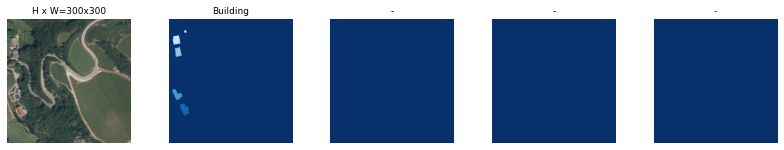

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


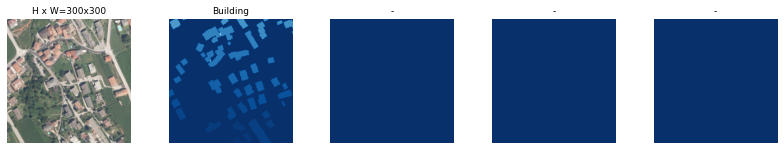

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


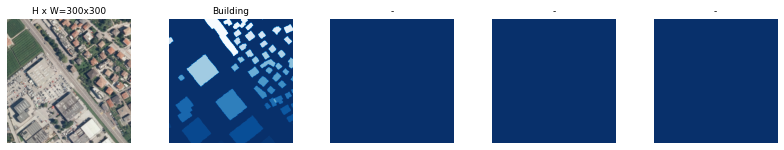

[1 1 1 1 1 1 1 1]


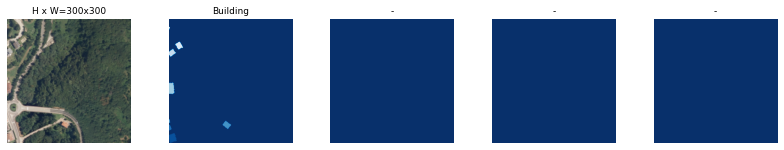

image ID: Building.848 (848) 


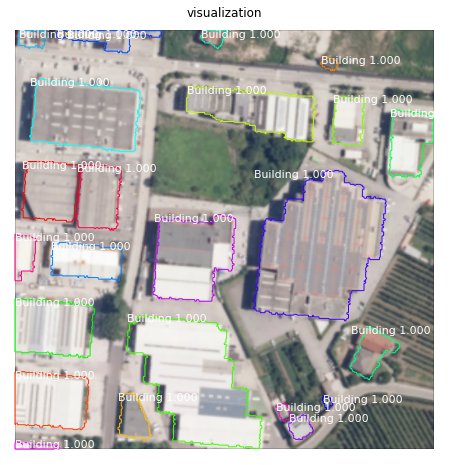

In [ ]:
breakSize=0.8
filenames= os.listdir(R_Images)

shuffle(filenames,random_state=0)
trainFileNames=filenames[:int(len(filenames)*breakSize)]
ValFileNames=filenames[int(len(filenames)*breakSize):]

dataset_train = Dataset()

dataset_train.load_data(trainFileNames,R_Images,R_Masks)
dataset_train.prepare()
print(len(dataset_train.image_ids))

dataset_val = Dataset()

dataset_val.load_data(ValFileNames,R_Images,R_Masks)
dataset_val.prepare()
print(len(dataset_val.image_ids))

for dataset in [dataset_val,dataset_train]:
  image_ids = np.random.choice(dataset.image_ids, 2)
  for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    print(class_ids)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)



image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id,
                                       dataset.image_reference(image_id)))


visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id,
                            dataset.class_names, np.array([1 for _ in range(len(gt_class_id))]), ax=get_ax(),
                            title="visualization",show_mask=False,show_bbox=False)


plt.show()

##Create Model For Inference


> Now we will create our model in Inference state. We would do this by using the configurations that we loaded in the previous cell.



In [ ]:
model = modellib.MaskRCNN(mode="inference", config=config,
                          model_dir=MODEL_LOG_DIR)

## Load weights into Model


> Now we load the weights of Phase 1 model in to our current inference model.


In [ ]:
path=MODEL_DIR_WEIGHTS+'/BestModelWeights1.h5'
model.load_weights(path, by_name=True)


## Run Detection

image ID: Building.487 (487) 

*** No instances to display *** 



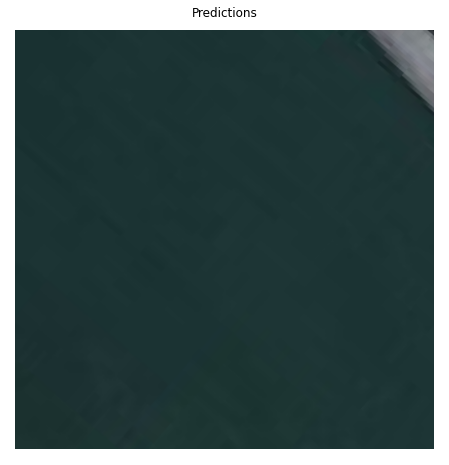

image ID: Building.554 (554) 


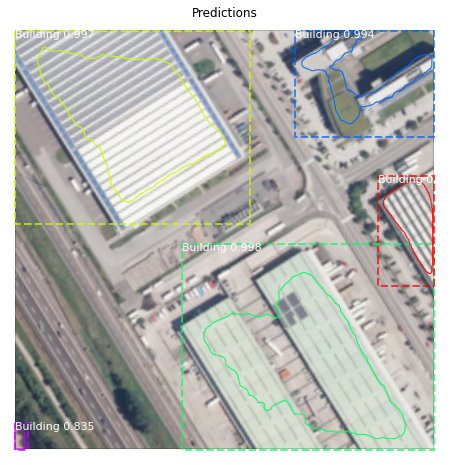

image ID: Building.537 (537) 


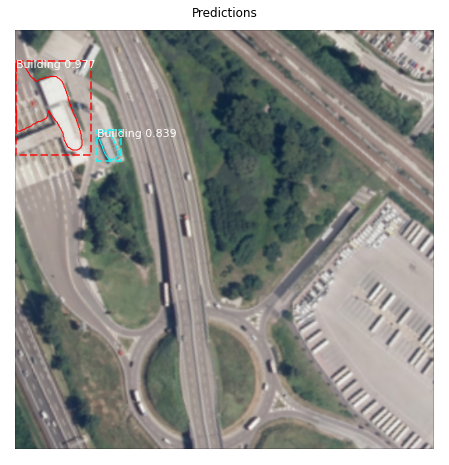

image ID: Building.18 (18) 


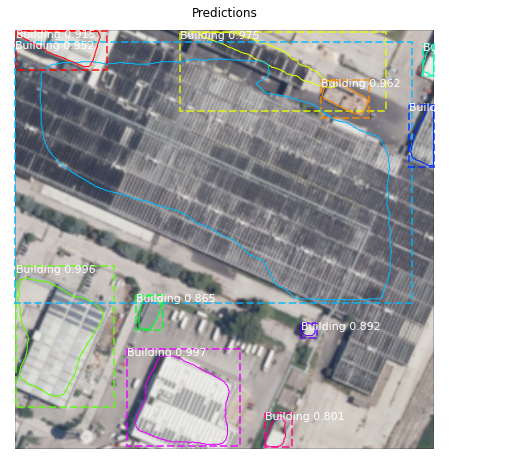

image ID: Building.399 (399) 


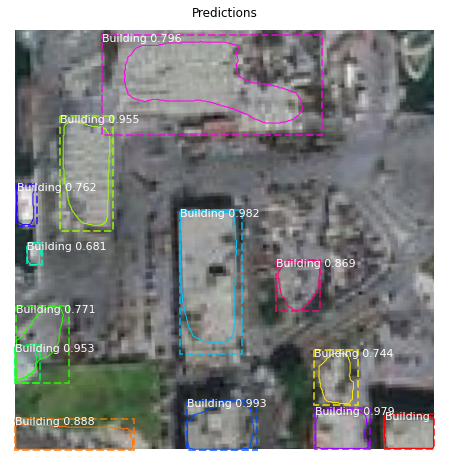

image ID: Building.421 (421) 


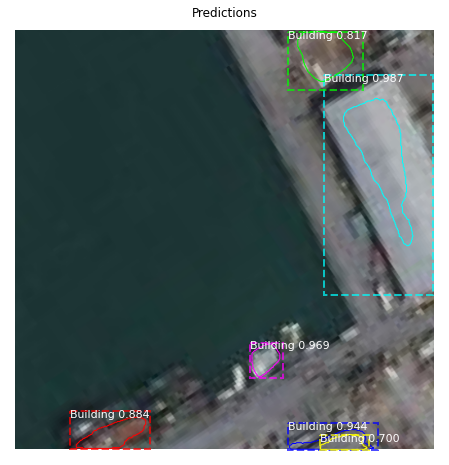

image ID: Building.468 (468) 


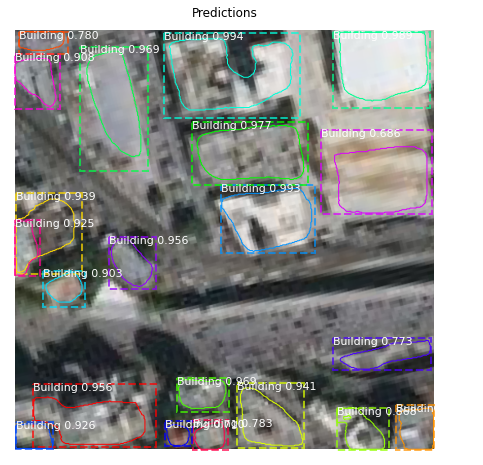

image ID: Building.438 (438) 


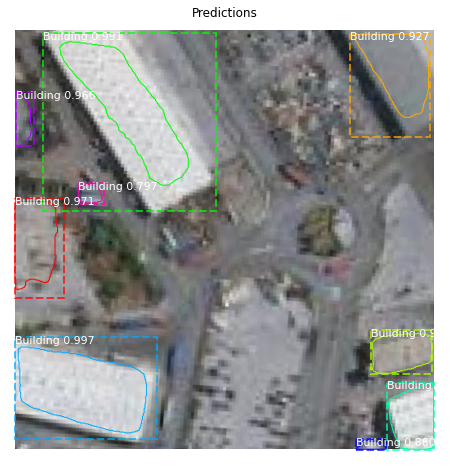

image ID: Building.85 (85) 


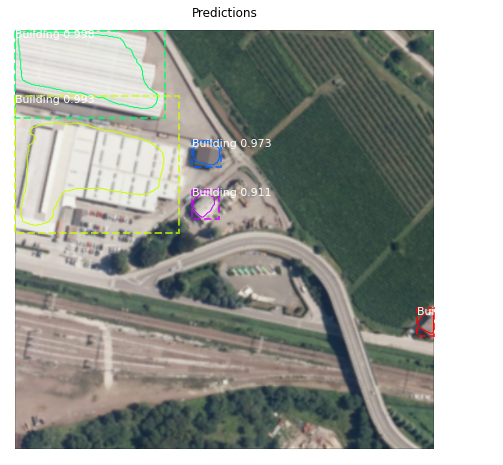

image ID: Building.154 (154) 


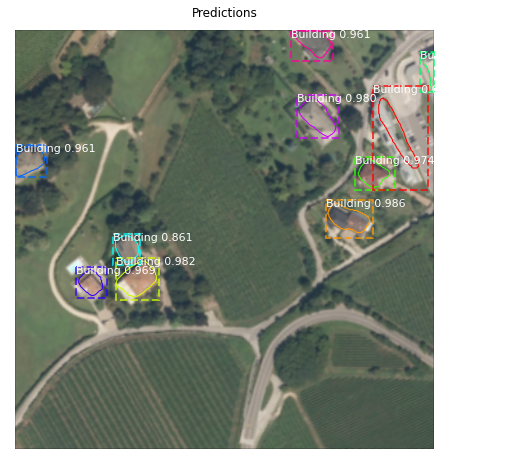

image ID: Building.621 (621) 


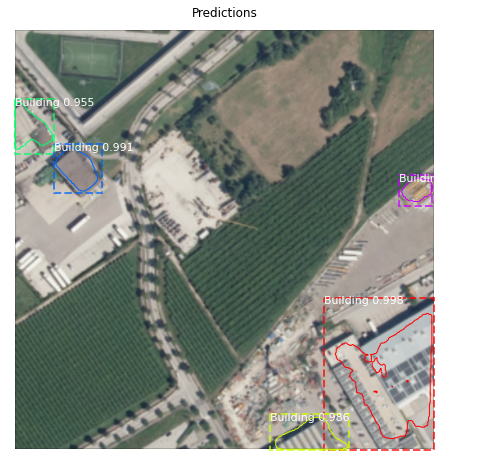

image ID: Building.290 (290) 


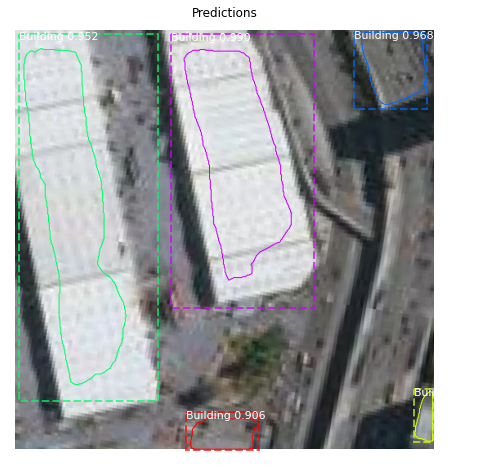

image ID: Building.674 (674) 


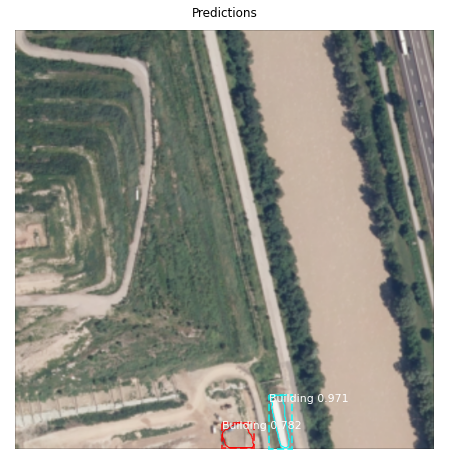

image ID: Building.359 (359) 


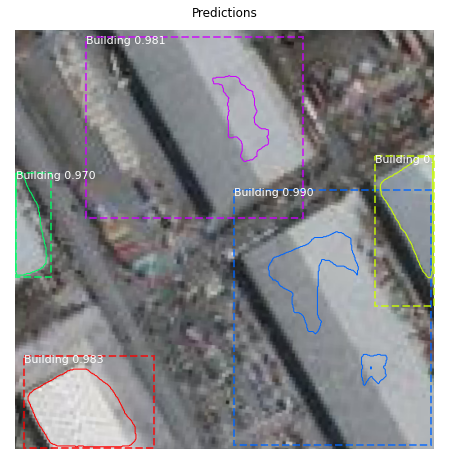

image ID: Building.65 (65) 


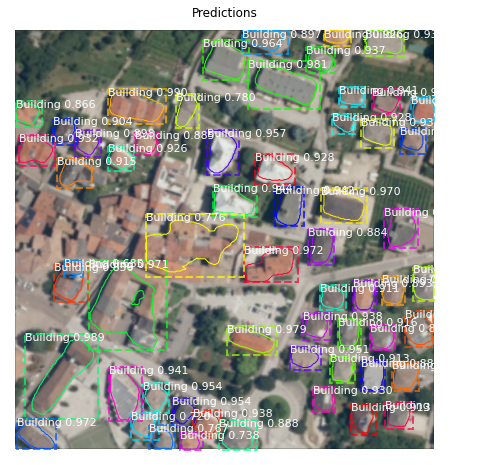

image ID: Building.575 (575) 


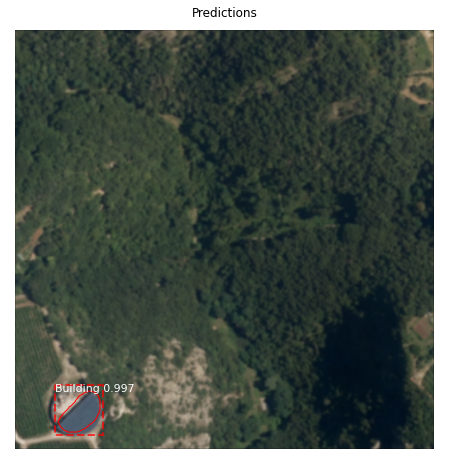

image ID: Building.51 (51) 


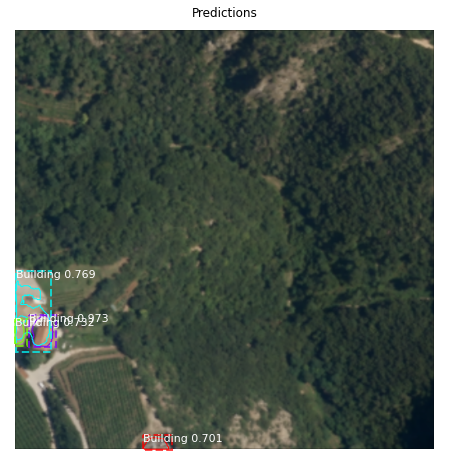

image ID: Building.53 (53) 


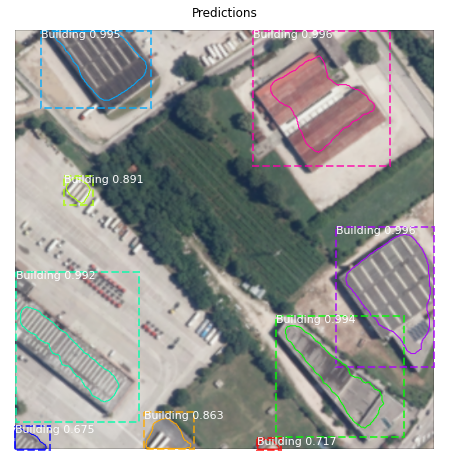

image ID: Building.17 (17) 


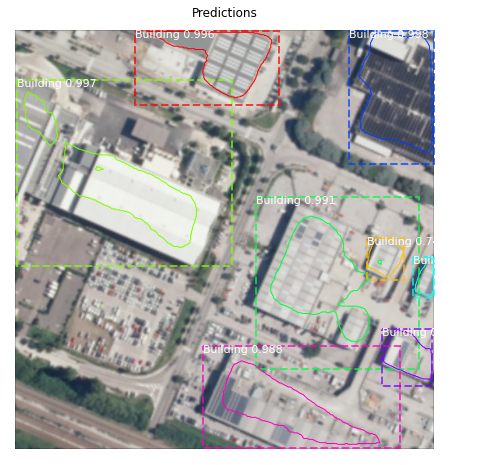

image ID: Building.37 (37) 


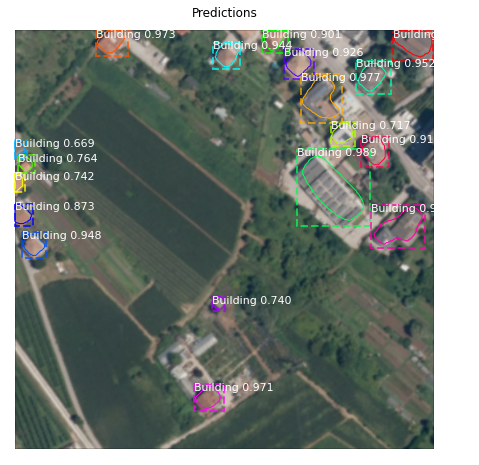

image ID: Building.620 (620) 


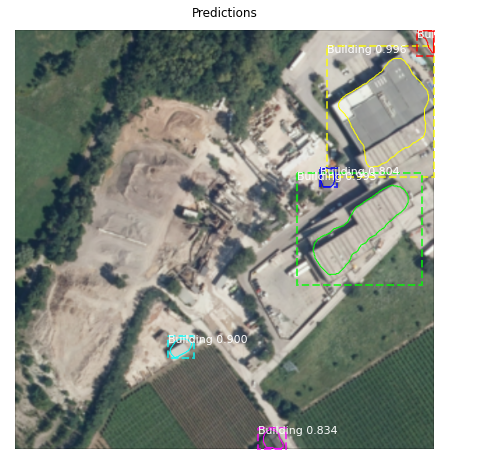

image ID: Building.627 (627) 


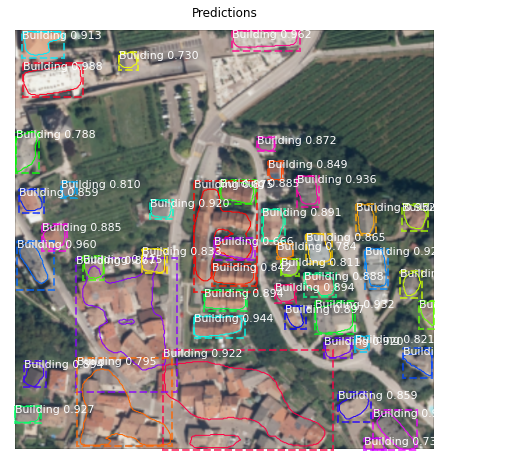

image ID: Building.606 (606) 


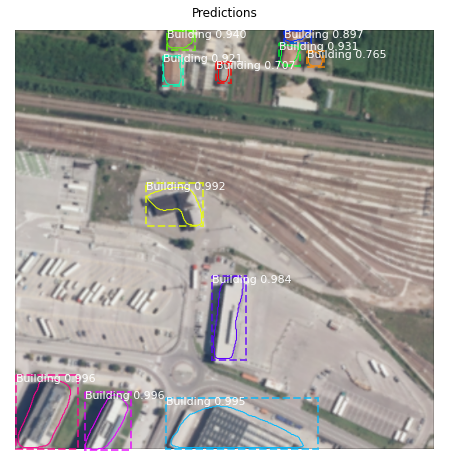

image ID: Building.296 (296) 


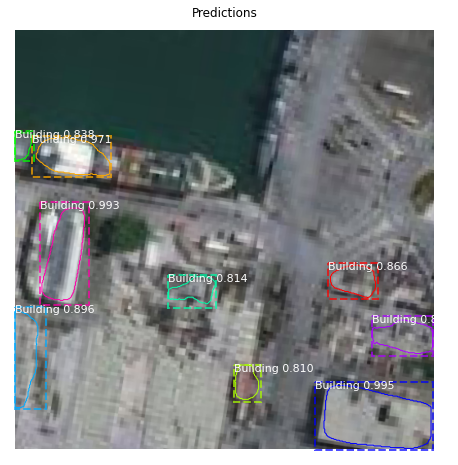

image ID: Building.76 (76) 


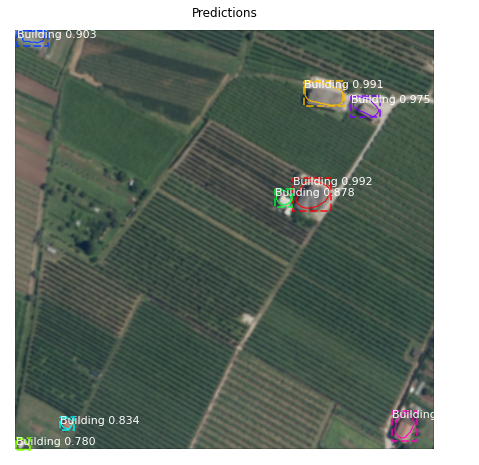

image ID: Building.219 (219) 


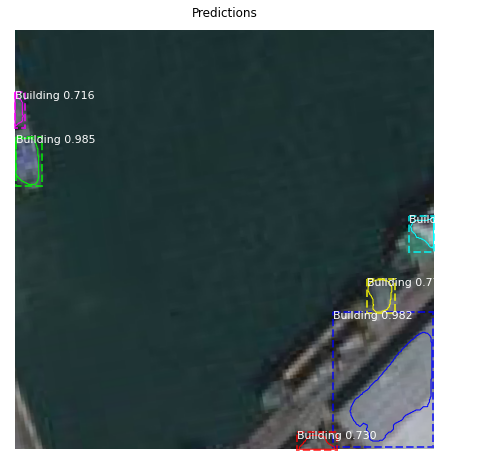

image ID: Building.693 (693) 


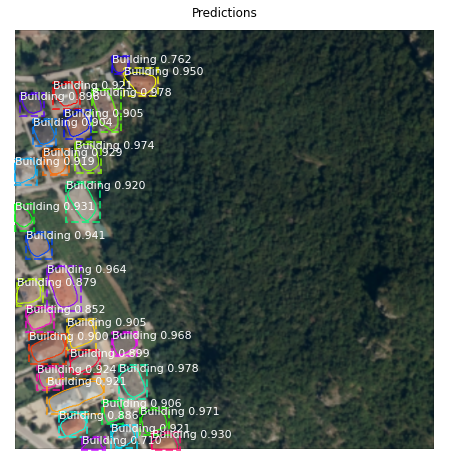

image ID: Building.405 (405) 


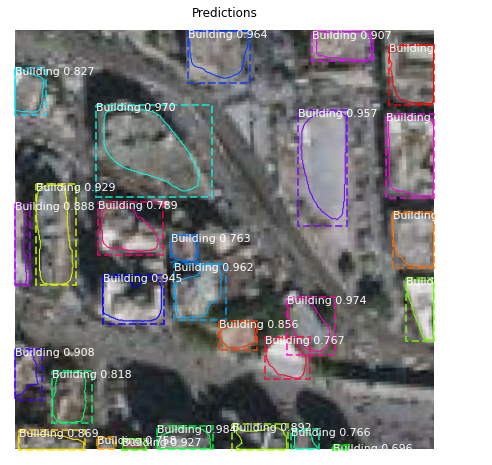

image ID: Building.552 (552) 


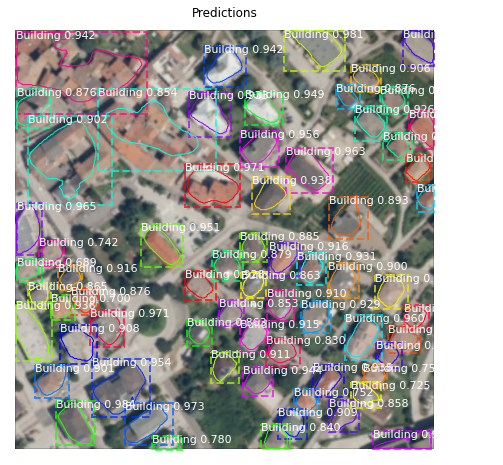

image ID: Building.286 (286) 


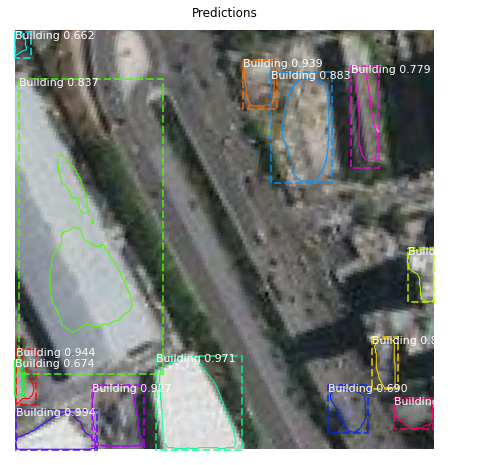

In [ ]:
for _ in range(30):

  image_id = random.choice(dataset_val.image_ids)
  image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, config, image_id, use_mini_mask=False)
  info = dataset_val.image_info[image_id]
  print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id,
                                       dataset_val.image_reference(image_id)))
  # Run object detection
  results = model.detect([image], verbose=0)

  # Display results
  ax = get_ax(1)
  r = results[0]
  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                            dataset_val.class_names, r['scores'], ax=ax,
                            title="Predictions",show_mask=False)

  plt.show()

image ID: Building.157 (157) 


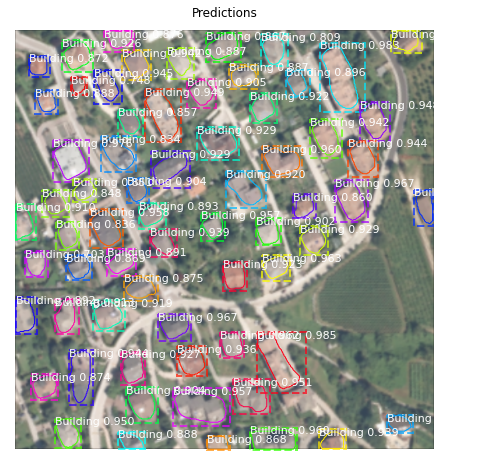

image ID: Building.157 (157) 


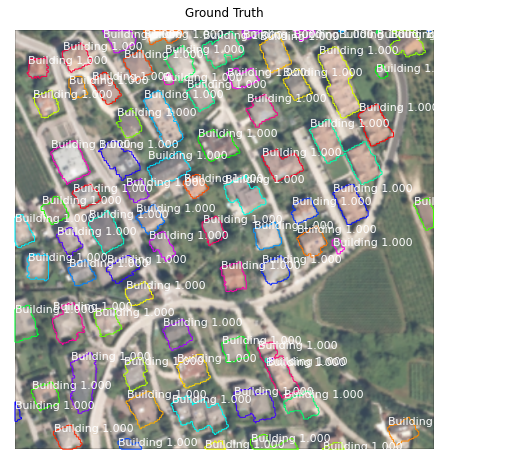

In [ ]:

image_id = random.choice(dataset_val.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, config, image_id, use_mini_mask=False)
info = dataset_val.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id,
                                       dataset_val.image_reference(image_id)))
  # Run object detection
results = model.detect([image], verbose=0)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                            dataset_val.class_names, r['scores'], ax=ax,
                            title="Predictions",show_mask=False)

plt.show()

##display ground truths


visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id,
                            dataset_val.class_names, np.array([1 for _ in range(len(gt_class_id))]), ax=get_ax(),
                            title="Ground Truth",show_mask=False,show_bbox=False)

plt.show()

### Precision-Recall

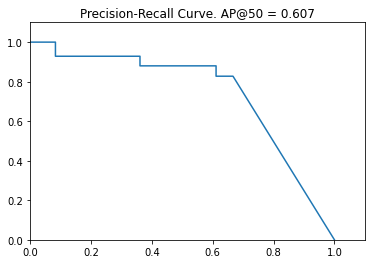

In [ ]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
visualize.plot_precision_recall(AP, precisions, recalls)

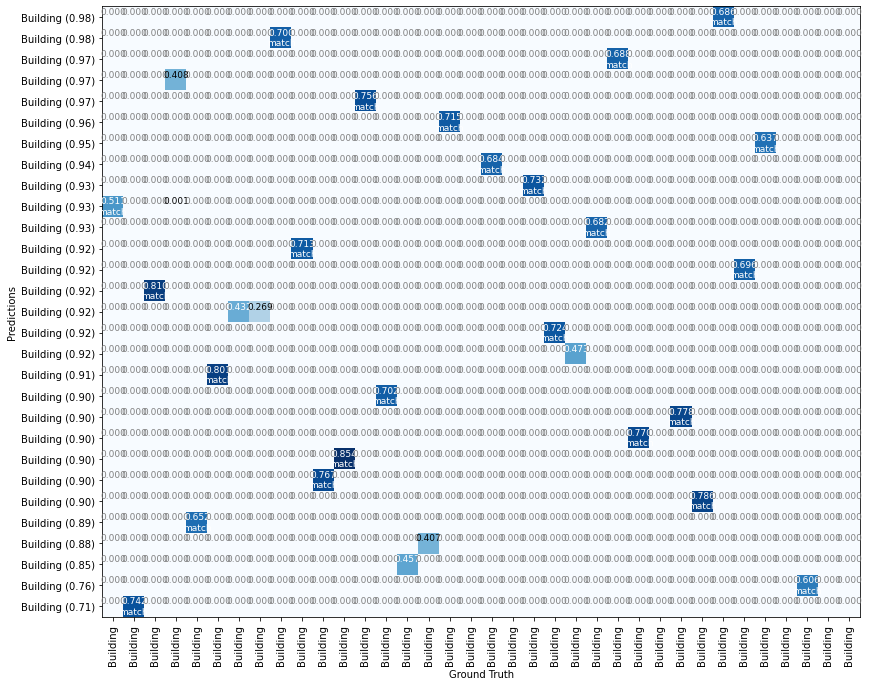

In [ ]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

### Compute mAP @ IoU=65 on Batch of Images from Eval

99
mAP @ IoU=65:  0.581
tp for each class: [0, 1443]
fp for each class: [336, 664]
fn for each class: [664, 336]
tn for each class: [1443, 0]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       336
           1       0.81      0.68      0.74      2107

    accuracy                           0.59      2443
   macro avg       0.41      0.34      0.37      2443
weighted avg       0.70      0.59      0.64      2443



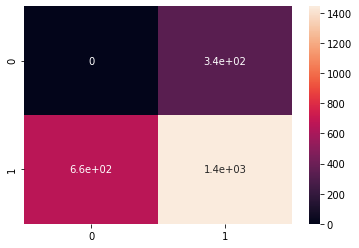

In [ ]:


image_ids = dataset_val.image_ids
APs,pricisions,Recalls,Overlaps,gt_tot,pred_tot = compute_batch_ap(dataset_val,image_ids,100)
print("mAP @ IoU=65: ",round(np.mean(APs), 3) )
gt_tot=gt_tot.astype(int)
pred_tot=pred_tot.astype(int)
tp, fp, fn, tn, confm = plot_confusion_matrix_from_data(gt_tot,pred_tot,fz=18, figsize=(20,20), lw=0.5)
# tp, fp, fn, tn for each class
print("tp for each class:",tp)
print("fp for each class:",fp)
print("fn for each class:",fn)
print("tn for each class:",tn)

print(classification_report(gt_tot, pred_tot))

### Compute mAP @ IoU=65 on Batch of Images from Train

99
mAP @ IoU=50:  0.424
tp for each class: [0, 1192]
fp for each class: [465, 877]
fn for each class: [877, 465]
tn for each class: [1192, 0]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       465
           1       0.72      0.58      0.64      2069

    accuracy                           0.47      2534
   macro avg       0.36      0.29      0.32      2534
weighted avg       0.59      0.47      0.52      2534



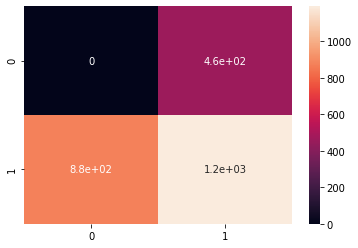

In [ ]:


image_ids = dataset_train.image_ids
APs,pricisions,Recalls,Overlaps,gt_tot,pred_tot = compute_batch_ap(dataset_train,image_ids,100)
print("mAP @ IoU=65: ", round(np.mean(APs), 3))
gt_tot=gt_tot.astype(int)
pred_tot=pred_tot.astype(int)
tp, fp, fn, tn, confm = plot_confusion_matrix_from_data(gt_tot,pred_tot,fz=18, figsize=(20,20), lw=0.5)
# tp, fp, fn, tn for each class
print("tp for each class:",tp)
print("fp for each class:",fp)
print("fn for each class:",fn)
print("tn for each class:",tn)


print(classification_report(gt_tot, pred_tot))

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [ ]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (65472,)              min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -4.08289  max:    3.54740  float64
positive_anchors         shape: (36, 4)               min:   -5.65685  max:  512.00000  float64
negative_anchors         shape: (220, 4)              min:  -32.00000  max:  512.00000  float64
neutral anchors          shape: (65216, 4)            min:  -90.50967  max:  538.50967  float64
refined_anchors          shape: (36, 4)               min:   -0.00000  max:  512.00000  float32


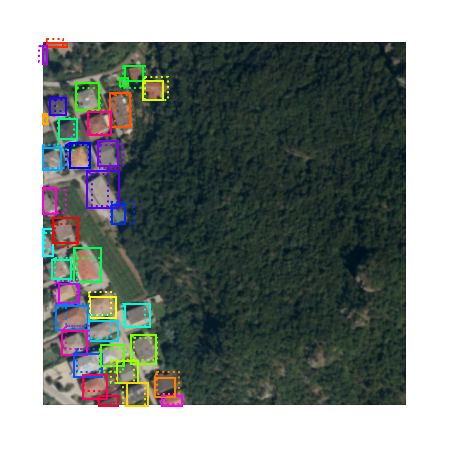

In [ ]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [ ]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 65472, 2)         min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.17712  max:    1.05188  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.15085  max:    1.02508  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (500,)                min:    0.00000  max:  864.00000  int32
proposals                shape: (1, 500, 4)           min:    0.00000  max:    1.00000  float32


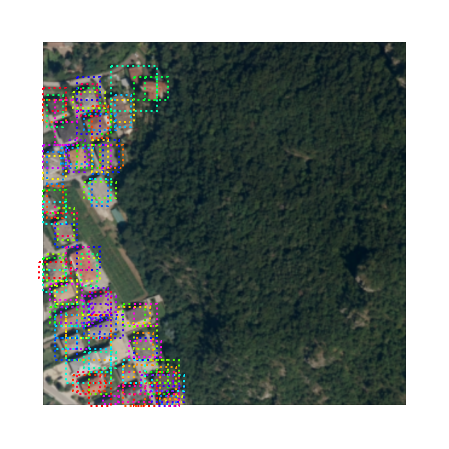

In [ ]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

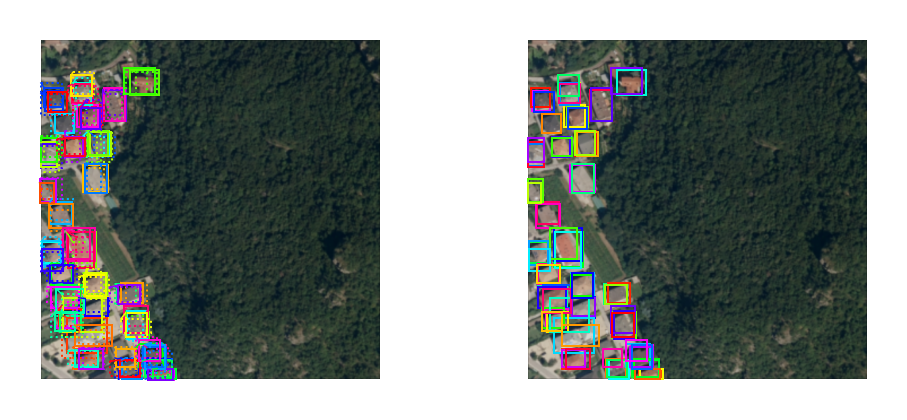

In [ ]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 80
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

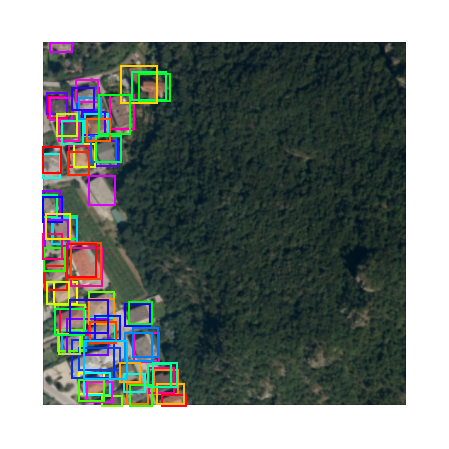

In [ ]:
# Show refined anchors after non-max suppression
limit = 80
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

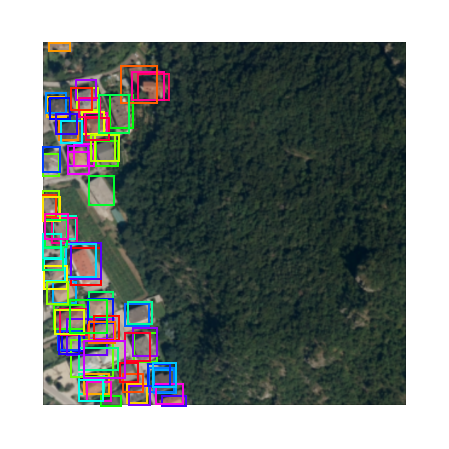

In [ ]:
# Show final proposals
# These are the same as the previous step (refined anchors
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 80
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [ ]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))


All Anchors (65472)       Recall: 0.083  Positive anchors: 3
Refined Anchors ( 6000)   Recall: 0.000  Positive anchors: 0
Post NMS Anchors (   80)  Recall: 0.528  Positive anchors: 21


## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [ ]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 500, 4)           min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 500, 2)           min:    0.00036  max:    0.99964  float32
deltas                   shape: (1, 500, 2, 4)        min:   -2.35676  max:    3.31019  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00039  max:    0.99934  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32


29 detections: ['Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building']


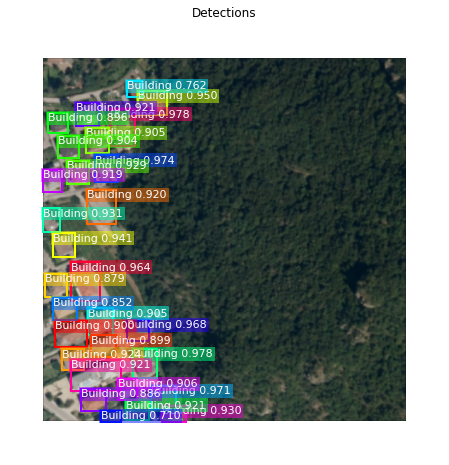

In [ ]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image,
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [ ]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

500 Valid proposals out of 500
130 Positive ROIs
[('BG', 370), ('Building', 130)]


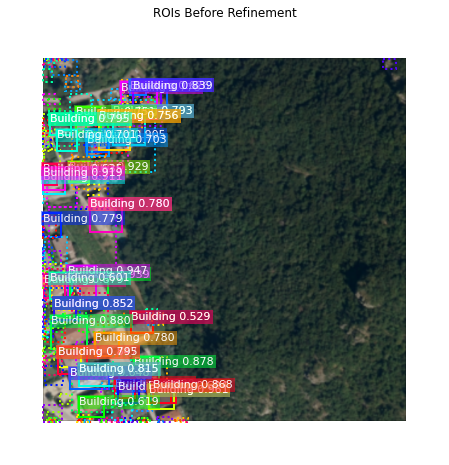

In [ ]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (500, 4)              min:   -2.28248  max:    3.31019  float32
refined_proposals        shape: (500, 4)              min:   -3.00000  max:  514.00000  int32


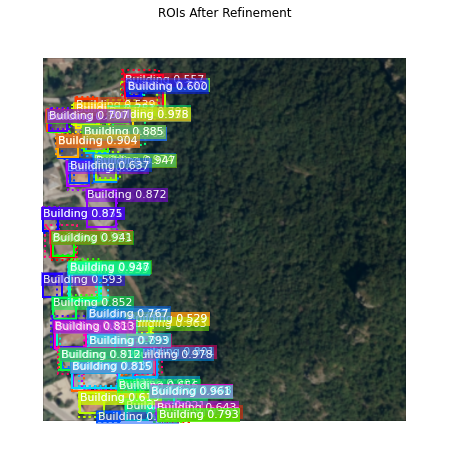

In [ ]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 80
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [ ]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 130 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  37  38  40  41  42  43  45  46  47  48  49  50  51  52  53  54  55  56
  57  59  60  62  65  66  67  68  69  70  72  74  77  78  79  81  82  83
  85  89  90  93  94  95  97  98  99 101 102 106 108 110 117 118 123 125
 126 127 134 135 138 146 148 163 182 208 209 211 212 220 223 229 230 240
 242 243 248 249 255 260 261 262 267 269 270 273 299 304 313 318 407 418
 435 438 482 497]


In [ ]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.65 confidence. Keep 104:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  23  24  25  26  27  28  29  30  31  32  33  34  35  37
  38  40  41  42  43  45  46  48  50  51  52  53  54  55  56  59  60  65
  66  67  68  69  70  72  77  81  83  85  89  90  94  98  99 101 102 106
 110 118 126 127 134 135 146 148 163 208 209 211 220 223 229 230 240 248
 249 260 261 262 267 269 270 273 304 418 435 438 482 497]


#### Per-Class Non-Max Suppression

In [ ]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs],
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20],
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

Building              : [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  23  24  25  26  27  28  29  30  31  32  33  34  35  37
  38  40  41  42  43  45  46  48  50  51  52  53  54  55  56  59  60  65
  66  67  68  69  70  72  77  81  83  85  89  90  94  98  99 101 102 106
 110 118 126 127 134 135 146 148 163 208 209 211 220 223 229 230 240 248
 249 260 261 262 267 269 270 273 304 418 435 438 482 497] -> [  1   0   2   3  15  31  40  13  25  90   4  26   6  11  28   7 304  51
   8  10 240  17  21 497  20   9  23  89  54]

Kept after per-class NMS: 29
[  0   1   2   3   4   6   7   8   9  10  11  13  15  17  20  21  23  25
  26  28  31  40  51  54  89  90 240 304 497]


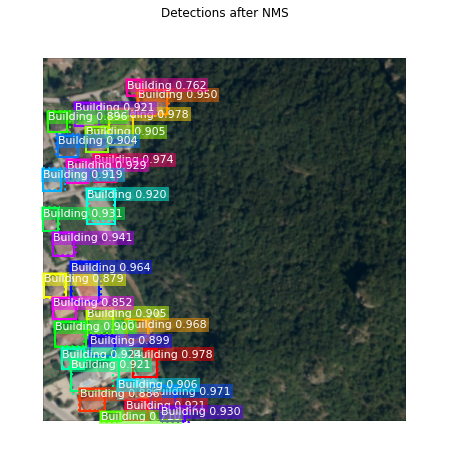

In [ ]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

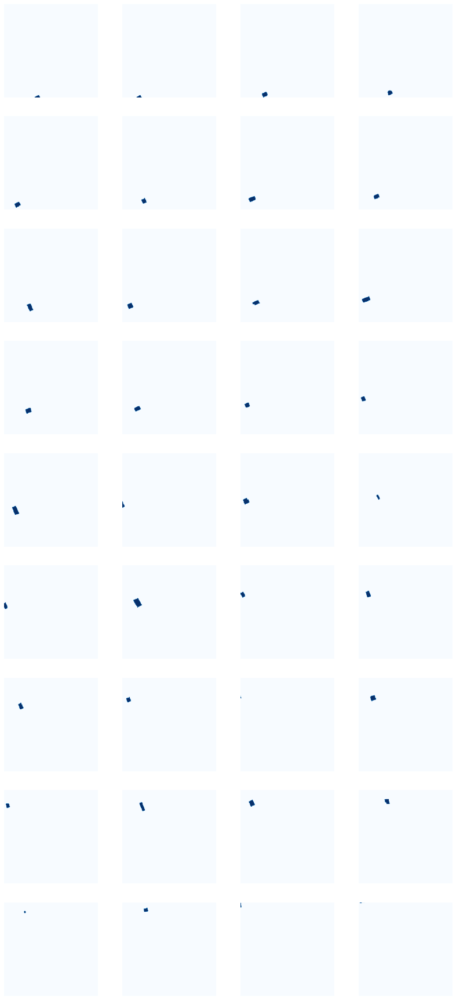

In [ ]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [ ]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00039  max:    0.99934  float32
29 detections: ['Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building' 'Building'
 'Building' 'Building' 'Building' 'Building' 'Building']


In [ ]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c]
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (29, 28, 28)          min:    0.00039  max:    0.99934  float32
det_masks                shape: (29, 512, 512)        min:    0.00000  max:    1.00000  bool


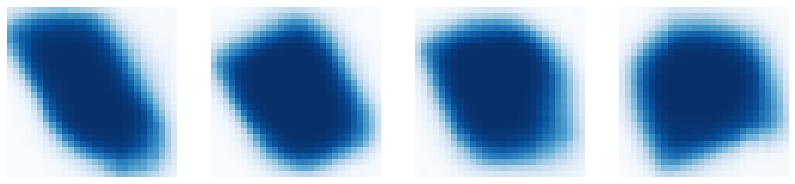

In [ ]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

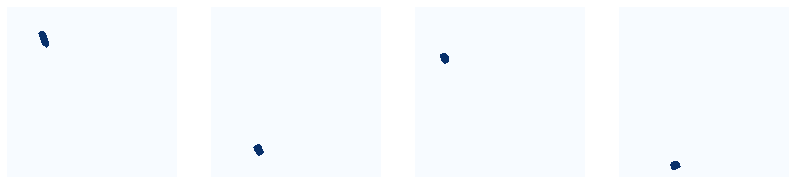

In [ ]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [ ]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 512, 512, 3)      min: -123.70000  max:  113.10000  float32
res4w_out                shape: (1, 32, 32, 1024)     min:    0.00000  max:   39.20883  float32
rpn_bbox                 shape: (1, 65472, 4)         min:   -9.78968  max:   10.17482  float32
roi                      shape: (1, 500, 4)           min:    0.00000  max:    1.00000  float32


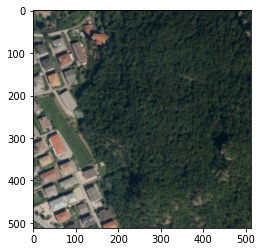

In [ ]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

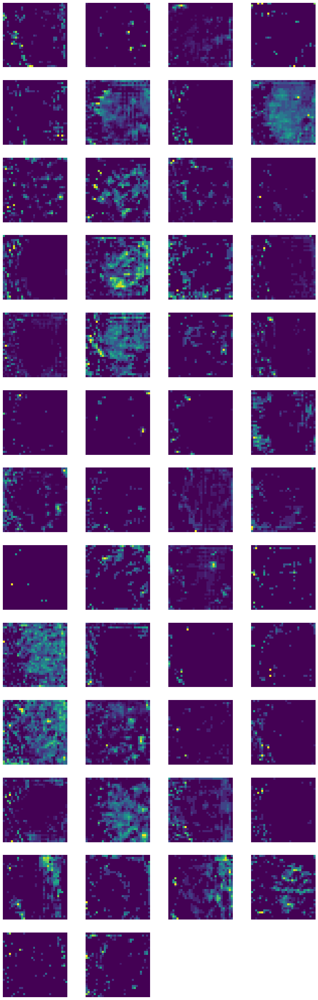

In [ ]:
# Backbone feature map
display_images(np.transpose(activations["res4w_out"][0,:,:,:50], [2, 0, 1]))

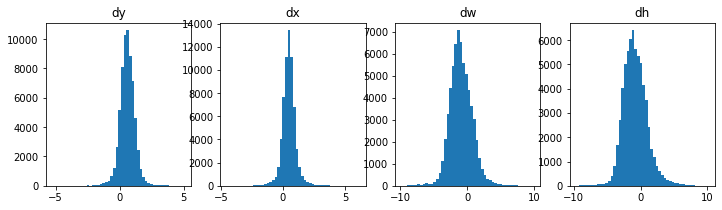

In [ ]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

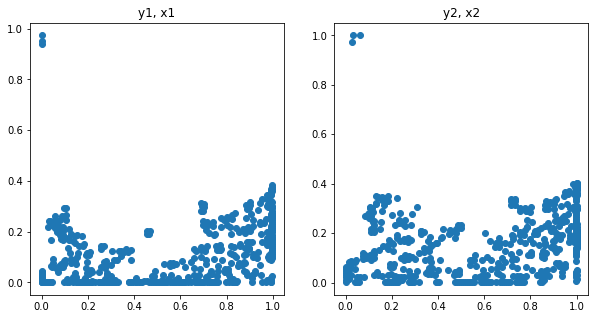

In [ ]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()